<a href="https://colab.research.google.com/github/HenryRandall/precinct_creator/blob/main/precinct_creator.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install geopandas
!pip install mapclassify
!pip install contextily
!pip install alphashape
!pip install pygris

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.1/59.1 kB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 17.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 543.2/543.2 kB 9.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 704.4/704.4 kB 28.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.7/55.7 kB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 56.2 MB/s eta 0:00:00


In [ ]:
# https://geopandas.org/en/stable/docs.html
import pandas as pd
import geopandas as gpd
from google.colab import files
import folium
import matplotlib
import mapclassify
import contextily as cx
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import os
import shutil
import statistics
from shapely.geometry import GeometryCollection, MultiPoint, Polygon, Point, LineString, MultiPolygon
import alphashape
import pygris
from itertools import combinations
from shapely.ops import nearest_points, split
import math
from sklearn.neighbors import BallTree
import numpy as np

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.expand_frame_repr', False)
pd.options.mode.chained_assignment = None  # default='warn'

In [ ]:
# Set Variables
# alphas = [200,100,50,25,10,5] #Alpha value of the alpha shape creation used in the geolocation error removals
# alpha_last = 1 #Last Alpha value used to create the final prcinct shapefiles
stdev_from_mean = 3 #Standard Deviation of Data Point Removed Immediatly
state = 'GA' #State you are working in
county = 'Gwinnett' #County you are working in
# Article i saw used 0.001 but i switched to 0.1 when i switched crs because it was taking too long
step_size = 0.02 #Size of buffer added to precincts to expand them
threshhold = 0.99999 #Area of county covered needed to stop expanding
removal_thresh = 1E-3 #Threshold to find polygons small enough from precinct shape,this is multiplied by the mean area of polygons
geolocated_error_thresh = 0.01 #percent of points in a precinct needed in a cluster to stay valid, 0.001 is 0.1%. tried 0.001 and 0.005 and both let in outliers

In [ ]:
# Get the shapefile for all counties in the US
# counties = pygris.counties() #Might not need this
# Get the shapefile for a specific state (e.g., California)
counties_gpd = pygris.counties(state=state)
counties_gpd = counties_gpd.to_crs('EPSG:4326')
state_shape = counties_gpd.union_all()

Using the default year of 2021
Using FIPS code '13' for input 'GA'


In [ ]:
# Load in Data and Drop NAs
voter_file = pd.read_excel('/content/lat_long.xlsx')
voter_file = voter_file.dropna(subset=['Latitude'])
voter_file = voter_file.dropna(subset=['Longitude'])
voter_file = voter_file.dropna(subset=['PrecinctName'])

# Convert crs and clip anything coming up outside of the state
voter_file = gpd.GeoDataFrame(voter_file, geometry=gpd.points_from_xy(voter_file.Longitude, voter_file.Latitude), crs="EPSG:4326")
voter_file = gpd.clip(voter_file, state_shape)
voter_file['CountyName'] = voter_file['PrecinctName'].str.split(' - ').str.get(0)

In [ ]:
voter_file.head()

,Latitude,Longitude,PrecinctName,geometry,CountyName
409720,33.906410,-83.832070,Gwinnett - 151,POINT (-83.83207 33.90641),Gwinnett
288929,33.906659,-83.832650,Gwinnett - 151,POINT (-83.83265 33.90666),Gwinnett
216833,33.906746,-83.832308,Gwinnett - 151,POINT (-83.83231 33.90675),Gwinnett
455925,33.906781,-83.832133,Gwinnett - 151,POINT (-83.83213 33.90678),Gwinnett
407506,33.906938,-83.831733,Gwinnett - 151,POINT (-83.83173 33.90694),Gwinnett


In [ ]:
# Loading in County Specific dfs
voter_file_county = voter_file.loc[voter_file['CountyName'].isin([county])]
precinct_names = sorted(voter_file_county['PrecinctName'].unique())
# Save Stats for later CRS
mean_county_lon = statistics.mean(voter_file_county['Longitude'])
mean_count_lat = statistics.mean(voter_file_county['Latitude'])
crs = f'+proj=cea +lat_0={mean_count_lat} +lon_0={mean_county_lon} +units=mi'
# Create County Shape
county_shape = counties_gpd.loc[counties_gpd['NAME'].isin([county])].to_crs(crs).geometry.iloc[0]
voter_file_county = voter_file_county.to_crs(crs)
voter_file_county = gpd.clip(voter_file_county, county_shape)

Declare K Nearest Neighbors Filter Functions


In [ ]:
# First 2 Functions taken mostly from this research
# https://autogis-site.readthedocs.io/en/2019/notebooks/L3/nearest-neighbor-faster.html

def get_nearest(src_points, candidates, k_neighbors=1):
    """Find nearest neighbors for all source points from a set of candidate points"""

    # Create tree from the candidate points
    tree = BallTree(candidates, leaf_size=15, metric='haversine')

    # Find closest points and distances
    distances, indices = tree.query(src_points, k=k_neighbors)

    # Transpose to get distances and indices into arrays
    distances = distances.transpose()
    indices = indices.transpose()

    # Get closest indices and distances (i.e. array at index 0)
    # note: for the second closest points, you would take index 1, etc.
    closest = indices[k_neighbors-1]
    closest_dist = distances[k_neighbors-1]

    # Return indices and distances
    return (closest, closest_dist)

def nearest_neighbor(left_gdf, right_gdf, k, return_dist=True):
  """
  For each point in left_gdf, find kth closest point in right GeoDataFrame and return them.

  NOTICE: Assumes that the input Points are in WGS84 projection (lat/lon).
  """

  left_geom_col = left_gdf.geometry.name
  right_geom_col = right_gdf.geometry.name

  # Ensure that index in right gdf is formed of sequential numbers
  right = right_gdf.copy().reset_index(drop=True)

  # Parse coordinates from points and insert them into a numpy array as RADIANS
  left_radians = np.array(left_gdf[left_geom_col].apply(lambda geom: (geom.x * np.pi / 180, geom.y * np.pi / 180)).to_list())
  right_radians = np.array(right[right_geom_col].apply(lambda geom: (geom.x * np.pi / 180, geom.y * np.pi / 180)).to_list())

  # Find the nearest points
  # -----------------------
  # closest ==> index in right_gdf that corresponds to the closest point
  # dist ==> distance between the nearest neighbors (in meters)

  closest, dist = get_nearest(src_points=left_radians, candidates=right_radians, k_neighbors=k)

  # Return points from right GeoDataFrame that are closest to points in left GeoDataFrame
  closest_points = right.loc[closest]

  # Ensure that the index corresponds the one in left_gdf
  closest_points = closest_points.reset_index(drop=True)

  # Add distance if requested
  if return_dist:
      # Convert to meters from radians
      earth_radius = 6371000  # meters
      closest_points['distance'] = dist * earth_radius

  return closest_points

def k_nearest_neighbor_filer(gdf, geolocated_error_thresh, stdev_from_mean, crs):
  gdf = gdf.reset_index()
  gdf = gdf.to_crs(crs="EPSG:4326")
  k = math.floor(len(gdf.index) * geolocated_error_thresh)+1 #Since k=1 finds distnace to self add 1 to counter act
  dist_gdf = nearest_neighbor(gdf,gdf,k)
  # add distance measure to old dataframe
  gdf['distance'] = dist_gdf['distance']

  # Calculate Summary Stats and filter out distance outliers
  stdev_dis = statistics.stdev(gdf['distance'])
  mean_dis = statistics.mean(gdf['distance'])
  lb_dis = mean_dis - (stdev_from_mean*stdev_dis)
  ub_dis = mean_dis + (stdev_from_mean*stdev_dis)

  # Cleaning data by removing outliers
  gdf = gdf[gdf['distance'] >= lb_dis]
  gdf = gdf[gdf['distance'] <= ub_dis]

  # Return to static CRS and drop distance column
  gdf = gdf.to_crs(crs)
  gdf.drop(columns='distance', inplace = True)

  return gdf

Current Precinct Filtering and Creation Module - Concave Hull



In [ ]:
# Base Precinct Creations
precinct_list = []

for precinct_name in precinct_names:
  # Prep Precinct Data
  voter_file_precinct = voter_file_county.loc[voter_file_county['PrecinctName'].isin([precinct_name])]
  voter_file_precinct = voter_file_precinct.drop_duplicates(subset=['Latitude', 'Longitude'])
  voter_file_precinct = voter_file_precinct.reset_index(drop=True)

  # k nearest neighbors filter, check functions for details
  voter_file_precinct_filtered = k_nearest_neighbor_filer(voter_file_precinct, geolocated_error_thresh, stdev_from_mean, crs)

  # Refilter until nothing is removed - while loop needed here
  row_change = len(voter_file_precinct.index) - len(voter_file_precinct_filtered.index)
  if row_change > 0:
    row_start = len(voter_file_precinct_filtered.index)
    voter_file_precinct_filtered = k_nearest_neighbor_filer(voter_file_precinct_filtered, geolocated_error_thresh, stdev_from_mean, crs)
    row_change = row_start - len(voter_file_precinct_filtered.index)

  # Create hulls
  multipoint = voter_file_precinct_filtered.dissolve()
  hull = multipoint.concave_hull()
  precinct_list.append({'PrecinctName': precinct_name, 'geometry': hull[0]})

precinct_df = gpd.GeoDataFrame(precinct_list, geometry='geometry', crs=crs)

In [ ]:
precinct_name = precinct_names[94]
voter_file_precinct = voter_file_county.loc[voter_file_county['PrecinctName'].isin([precinct_name])]
voter_file_precinct = voter_file_precinct.drop_duplicates(subset=['Latitude', 'Longitude'])
voter_file_precinct = voter_file_precinct.reset_index(drop=True)
voter_file_precinct.explore()

# k = math.floor(len(voter_file_precinct.index) * geolocated_error_thresh)+1
# multipoint = voter_file_precinct.dissolve()
# hull = multipoint.concave_hull()
# hull.explore()

<Axes: >

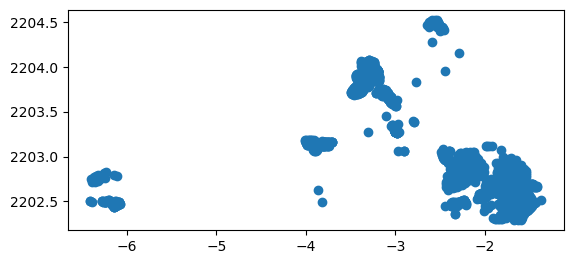

In [ ]:
voter_file_precinct_filtered = k_nearest_neighbor_filer(voter_file_precinct, geolocated_error_thresh, stdev_from_mean, crs)
voter_file_precinct_filtered.plot()

In [ ]:
precinct_df.explore()

<Axes: >

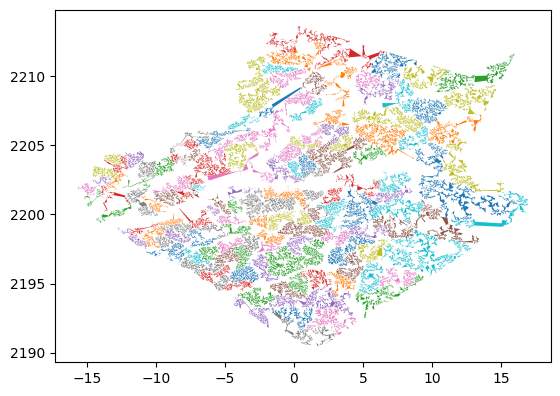

In [ ]:
precinct_df.plot(column='PrecinctName', legend=False)

Current Precinct Filtering and Creation Module - Alpha Shape

In [ ]:
# Base Precinct Creations
precinct_list = []

for precinct_name in precinct_names:
  # Prep Precinct Data
  voter_file_precinct = voter_file_county.loc[voter_file_county['PrecinctName'].isin([precinct_name])]
  voter_file_precinct = voter_file_precinct.drop_duplicates(subset=['Latitude', 'Longitude'])
  voter_file_precinct = voter_file_precinct.reset_index(drop=True)

  # k nearest neighbors filter, check functions for details
  voter_file_precinct_filtered = k_nearest_neighbor_filer(voter_file_precinct, geolocated_error_thresh, stdev_from_mean, crs)

  # Create hulls
  multipoint = list(voter_file_precinct['geometry'])
  hull = alphashape.alphashape(voter_file_precinct, alpha_last)
  precinct_list.append({'PrecinctName': precinct_name, 'geometry': hull['geometry'][0]})

precinct_df = gpd.GeoDataFrame(precinct_list, geometry='geometry', crs=crs)

<Axes: >

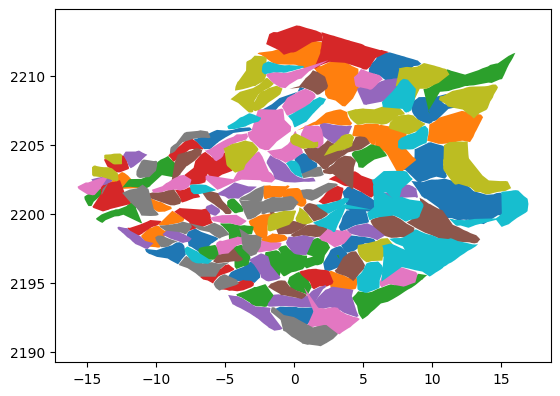

In [ ]:
precinct_df.plot(column='PrecinctName', legend=False)

Ideas to maybe Improve:

1.   Alpha shapes, but tuned
2.   Precincts fight over areas based on how many people are correctly placed there
3.   Simplify shapes before expansion

In [ ]:
def resolve_overlap_even_split(shape_1, shape_2):
  """takes in 2 shapely shapes and evenly splits them based on the points of intersection"""

  intersections = shape_1.intersection(shape_2)
  shape_1_new = shape_1.difference(shape_2)
  shape_2_new = shape_2.difference(shape_1)

  # https://gis.stackexchange.com/questions/374042/find-the-intersecting-points-of-2-polygons-in-python
  intersection_points = shape_1.boundary.intersection(shape_2.boundary)

  if isinstance(intersections, MultiPolygon) or isinstance(intersections, GeometryCollection):
    for intersection in list(intersections.geoms):
      if isinstance(intersection, LineString):
        continue
      points = intersection.boundary.intersection(intersection_points)

      if isinstance(points, MultiPoint):
        line = LineString(points.geoms)
        split_intersection = split(intersection, line)
      else:
        split_intersection = intersection

      if isinstance(split_intersection, MultiPolygon):
        for geom in split_intersection.geoms:
          if geom.distance(shape_1.centroid) < geom.distance(shape_2.centroid):
            shape_1_new = shape_1_new.union(geom)
          else:
            shape_2_new = shape_2_new.union(geom)
      else:
        if split_intersection.distance(shape_1.centroid) < split_intersection.distance(shape_2.centroid):
          shape_1_new = shape_1_new.union(split_intersection)
        else:
          shape_2_new = shape_2_new.union(split_intersection)


  elif isinstance(intersections, Polygon):
    if isinstance(intersection_points, MultiPoint):
      line = LineString(intersection_points.geoms)
      split_intersection = split(intersections, line)
    else:
      split_intersection = intersections

    if isinstance(split_intersection, MultiPolygon):
      for geom in split_intersection.geoms:
        if geom.distance(shape_1.centroid) < geom.distance(shape_2.centroid):
          shape_1_new = shape_1_new.union(geom)
        else:
          shape_2_new = shape_2_new.union(geom)
    else:
      if split_intersection.distance(shape_1.centroid) < split_intersection.distance(shape_2.centroid):
        shape_1_new = shape_1_new.union(split_intersection)
      else:
        shape_2_new = shape_2_new.union(split_intersection)

  return shape_1_new, shape_2_new

Expansion Module

(156, 2)
(156, 2)
0.22923795415300718
(156, 2)
0.46346134007767176
(156, 2)
0.5791689233037742
(156, 2)
0.6553675653100945
(156, 2)
0.7119919164968311
(156, 2)
0.7559115373105678
(156, 2)
0.791003599813309
(156, 2)
0.8194734667226032
(156, 2)
0.8432265012881416
(156, 2)
0.8630050948999022
(156, 2)
0.8800674222860615
(156, 2)
0.8946064024812063
(156, 2)
0.9073348937460036
(156, 2)
0.9183833817680094
(156, 2)
0.9280914754448443
(156, 2)
0.9367122295051626
(156, 2)
0.9443418339506113
(156, 2)
0.9511546657121132
(156, 2)
0.9571916963606665
(156, 2)
0.962497420882905
(156, 2)
0.9671804982232691
(156, 2)
0.9713521358438455
(156, 2)
0.9749909579310826
(156, 2)
0.9782142456881165
(156, 2)
0.980999787769878
(156, 2)
0.9834938622069778
(156, 2)
0.9855468525777156
(156, 2)
0.9873994189442934
(156, 2)
0.9889459266911991
(156, 2)
0.9902594834320948
(156, 2)
0.9913776572216808
(156, 2)
0.99223201370858
(156, 2)
0.9931041064133033
(156, 2)
0.993769770203563
(156, 2)
0.9943577209197659
(156, 2)
0.9949

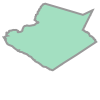

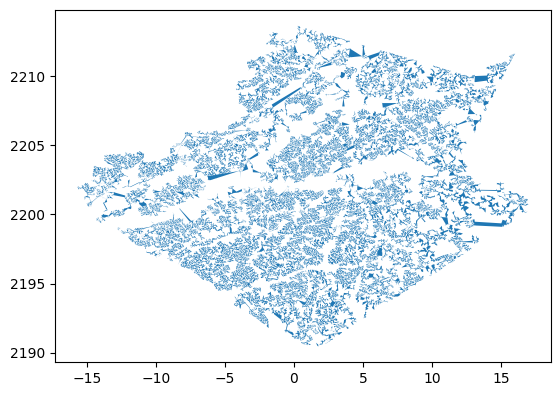

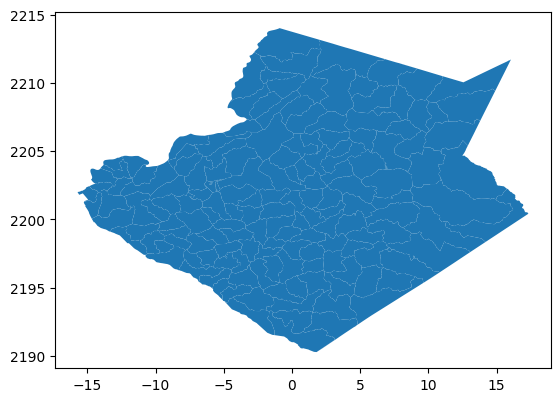

In [ ]:
# New Expansion Module
# Remove Overlaps in original creator
precinct_df_3=precinct_df.copy()
precinct_df_3['geometry'] = precinct_df_3['geometry'].to_crs(crs)
print(precinct_df_3.shape)
poly = precinct_df_3.geometry
for p1_idx, p2_idx in combinations(poly.index, 2):
    if poly.loc[p1_idx].overlaps(poly.loc[p2_idx]):
        # Store intermediary results back to poly
        poly.loc[p1_idx], poly.loc[p2_idx] = resolve_overlap_even_split(poly.loc[p1_idx],poly.loc[p2_idx])
precinct_df_3['geometry'] = poly
precinct_df_3 = precinct_df_3.explode()
precinct_df_3 = precinct_df_3[precinct_df_3.geometry.geom_type != 'LineString']
precinct_df_3['area']=precinct_df_3.geometry.area
precinct_df_3 = precinct_df_3[precinct_df_3['area'] > precinct_df_3['area'].mean()*removal_thresh]
precinct_df_3 = precinct_df_3.drop(['area'],axis=1)
precinct_df_3 = precinct_df_3.dissolve(by='PrecinctName')
precinct_df_3 = precinct_df_3.reset_index()


# Loop until hitting minimum coverage
while precinct_df_3.geometry.union_all().area < (county_shape.area)*threshhold:
  print(precinct_df_3.shape)
  print(precinct_df_3.geometry.union_all().area/(county_shape.area))
  # Simplify to make sure that it isnt getting increasingly complex
  precinct_df_3['geometry'] = precinct_df_3.simplify(step_size).make_valid()
  precinct_df_expanded = precinct_df_3.copy()
  # Expand by one step to eat out unassigned land
  precinct_df_expanded.geometry = precinct_df_expanded.geometry.buffer(step_size)

  # Cut out any additions that were part of a different precincts original hull
  poly_orig = precinct_df_3.geometry
  poly_expand = precinct_df_expanded.geometry
  for p1_idx, p2_idx in combinations(poly_orig.index, 2):
    try:
      if poly_expand.loc[p1_idx].boundary.intersects(poly_expand.loc[p2_idx].boundary):
        poly_expand.loc[p1_idx] -= poly_orig.loc[p2_idx]
        poly_expand.loc[p2_idx] -= poly_orig.loc[p1_idx]
    except:
      precinct_df_expanded['geometry'] = poly_expand
      precinct_df_expanded = precinct_df_expanded.explode()
      precinct_df_expanded = precinct_df_expanded[precinct_df_expanded.geometry.geom_type != 'LineString']
      precinct_df_expanded['area']=precinct_df_expanded.geometry.area
      precinct_df_expanded = precinct_df_expanded[precinct_df_expanded['area'] > precinct_df_expanded['area'].mean()*removal_thresh]
      precinct_df_expanded = precinct_df_expanded.dr  op(['area'],axis=1)
      precinct_df_expanded = precinct_df_expanded.dissolve(by='PrecinctName')
      precinct_df_expanded = precinct_df_expanded.reset_index()
      poly_expand = precinct_df_expanded.geometry
      if poly_expand.loc[p1_idx].boundary.intersects(poly_expand.loc[p2_idx].boundary):
        poly_expand.loc[p1_idx] -= poly_orig.loc[p2_idx]
        poly_expand.loc[p2_idx] -= poly_orig.loc[p1_idx]

  # Find overlapped still unsatisfied and give split by function
  for p1_idx, p2_idx in combinations(poly_expand.index, 2):
    try:
      if poly_expand.loc[p1_idx].boundary.intersects(poly_expand.loc[p2_idx].boundary):
        poly_expand.loc[p1_idx], poly_expand.loc[p2_idx] = resolve_overlap_even_split(poly_expand.loc[p1_idx],poly_expand.loc[p2_idx])
    except:
      precinct_df_expanded['geometry'] = poly_expand
      precinct_df_expanded = precinct_df_expanded.explode()
      precinct_df_expanded = precinct_df_expanded[precinct_df_expanded.geometry.geom_type != 'LineString']
      precinct_df_expanded['area']=precinct_df_expanded.geometry.area
      precinct_df_expanded = precinct_df_expanded[precinct_df_expanded['area'] > precinct_df_expanded['area'].mean()*removal_thresh]
      precinct_df_expanded = precinct_df_expanded.drop(['area'],axis=1)
      precinct_df_expanded = precinct_df_expanded.dissolve(by='PrecinctName')
      precinct_df_expanded = precinct_df_expanded.reset_index()
      poly_expand = precinct_df_expanded.geometry
      if poly_expand.loc[p1_idx].boundary.intersects(poly_expand.loc[p2_idx].boundary):
        poly_expand.loc[p1_idx], poly_expand.loc[p2_idx] = resolve_overlap_even_split(poly_expand.loc[p1_idx],poly_expand.loc[p2_idx])


  precinct_df_3['geometry'] = poly_expand
  precinct_df_3 = gpd.clip(precinct_df_3, county_shape)
  precinct_df_3 = precinct_df_3.explode()
  precinct_df_3 = precinct_df_3[precinct_df_3.geometry.geom_type != 'LineString']
  precinct_df_3['area']=precinct_df_3.geometry.area
  precinct_df_3 = precinct_df_3[precinct_df_3['area'] > precinct_df_3['area'].mean()*removal_thresh]
  precinct_df_3 = precinct_df_3.drop(['area'],axis=1)
  precinct_df_3 = precinct_df_3.dissolve(by='PrecinctName')
  precinct_df_3 = precinct_df_3.reset_index()

precinct_df.plot()
precinct_df_3.plot()
county_shape

In [ ]:
precinct_df_3.explore()

<Axes: >

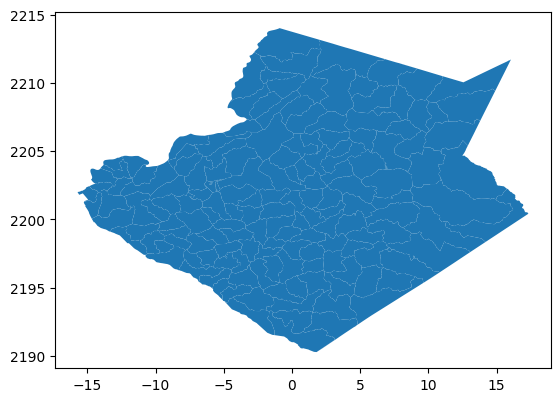

In [ ]:
precinct_df_3.plot()

In [ ]:
# Evaluator
control_precincts = gpd.read_file("/content/GA-PRECINCTS2022-SHAPE.shp")
control_precincts = control_precincts.loc[control_precincts['COUNTY'].isin([county.upper()])]
control_precincts = control_precincts.to_crs(crs)
control_precincts['precinct_name'] = control_precincts['COUNTY'] + ' - ' + control_precincts['PRECINCT_I']

data = []
for precinct_name in precinct_names:
# precinct_name = precinct_names[0]
  control_precinct = control_precincts.loc[control_precincts['precinct_name'].isin([precinct_name.upper()])]
  experiment_precinct = precinct_df_3.loc[precinct_df_3['PrecinctName'].isin([precinct_name])]
  control_precinct = control_precinct.geometry.reset_index().loc[0].geometry
  experiment_precinct = experiment_precinct.geometry.reset_index().loc[0].geometry
  data.append({'precinct_name':precinct_name ,'control_area': control_precinct.area, 'experiment_area': experiment_precinct.area, 'overlap_area': (control_precinct.intersection(experiment_precinct)).area})

evaluation_df = pd.DataFrame(data)
evaluation_df.loc["Total"] = evaluation_df.sum()
evaluation_df['%_correct'] = (evaluation_df['overlap_area']/evaluation_df['experiment_area'])*100
evaluation_df['%_missing'] = ((evaluation_df['control_area'] - evaluation_df['overlap_area'])/evaluation_df['overlap_area'])*100

evaluation_df.head()

,precinct_name,control_area,experiment_area,overlap_area,%_correct,%_missing
0,Gwinnett - 001,13.743063,13.511348,12.830797,94.963115,7.109974
1,Gwinnett - 002,2.864330,2.993761,2.690338,89.864821,6.467294
2,Gwinnett - 003,6.347904,5.596894,5.400512,96.491231,17.542635
3,Gwinnett - 004,2.212546,2.322168,1.954856,84.182379,13.182021
4,Gwinnett - 005,1.649118,1.645189,1.536318,93.382460,7.342185


In [ ]:
precinct_df_3.head()

,PrecinctName,geometry
0,Gwinnett - 001,"POLYGON ((9.487 2202.318, 9.595 2202.423, 9.65..."
1,Gwinnett - 002,"POLYGON ((-0.602 2193.29, -0.479 2193.327, -0...."
2,Gwinnett - 003,"POLYGON ((11.192 2204.457, 11.068 2204.23, 11...."
3,Gwinnett - 004,"POLYGON ((-1.339 2208.379, -1.163 2208.409, -0..."
4,Gwinnett - 005,"POLYGON ((5.266 2198.28, 5.516 2198.306, 5.8 2..."


In [ ]:
evaluation_df.sort_values(by='%_correct').head()
# evaluation_df.loc[94]

,precinct_name,control_area,experiment_area,overlap_area,%_correct,%_missing
123,Gwinnett - 124,0.841311,1.500611,0.815548,54.347754,3.158964
127,Gwinnett - 128,1.175371,2.128924,1.162165,54.589292,1.136367
49,Gwinnett - 050,1.479148,1.862415,1.254539,67.360850,17.903727
98,Gwinnett - 099,1.885314,2.676122,1.859038,69.467615,1.413450
85,Gwinnett - 086,1.525028,2.058682,1.479590,71.870723,3.071014


In [ ]:
error_map = precinct_df_3.merge(evaluation_df, left_on='PrecinctName', right_on='precinct_name')

In [ ]:
control_precincts.explore()

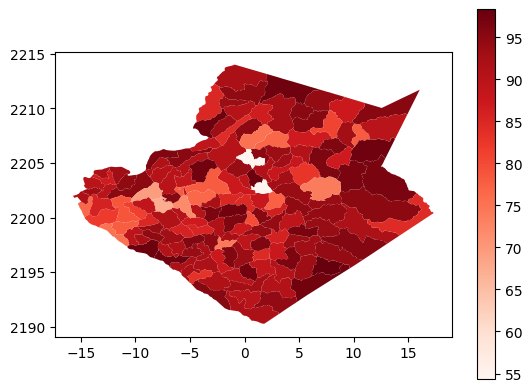

In [ ]:
error_map.plot(column='%_correct', cmap = 'Reds', legend=True)

m = error_map.explore(column='%_correct', cmap = 'Reds')
m

In [ ]:
evaluation_df.loc['Total']

,Total
precinct_name,Gwinnett - 001Gwinnett - 002Gwinnett - 003Gwin...
control_area,436.784146
experiment_area,436.781111
overlap_area,394.656065
%_correct,90.355571
%_missing,10.674632


In [ ]:
# Export/Importer
control_precincts = control_precincts.to_crs(crs = "EPSG:4326")
precinct_df_3.to_file("new_shapefile.shp")

test_import = gpd.read_file("/content/new_shapefile.shp")
test_import.explore()

<ipython-input-70-60bb39f7c043>:3: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  precinct_df_3.to_file("new_shapefile.shp")
/usr/local/lib/python3.10/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'PrecinctName' to 'PrecinctNa'
  ogr_write(


Old Code


Old Overlap Resolver

In [ ]:
def resolve_overlap_even_split(shape_1, shape_2):
  """takes in 2 shapely shapes and evenly splits them based on the points of intersection"""

  intersections = shape_1.intersection(shape_2)
  shape_1_new = shape_1.difference(shape_2)
  shape_2_new = shape_2.difference(shape_1)

  # https://gis.stackexchange.com/questions/374042/find-the-intersecting-points-of-2-polygons-in-python
  intersection_points = shape_1.boundary.intersection(shape_2.boundary)

  if isinstance(intersections, MultiPolygon):
    for intersection in list(intersections.geoms):
      points = intersection.boundary.intersection(intersection_points)
      if isinstance(points, MultiPoint):
        line = LineString(points.geoms)
        split_intersection = split(intersection, line)
        split_intersection = gpd.GeoDataFrame({'geometry': [split_intersection]}).explode()
      else:
        split_intersection = gpd.GeoDataFrame({'geometry': [intersections]})

      split_intersection['centroid'] = split_intersection.centroid
      split_intersection['dist_s1'] = split_intersection['centroid'].distance(shape_1.centroid)
      split_intersection['dist_s2'] = split_intersection['centroid'].distance(shape_2.centroid)
      split_intersection.reset_index(inplace=True)

      if len(split_intersection.index) == 2:
        int1_s1_int2_s2 = split_intersection.loc[0]['dist_s1'] +split_intersection.loc[1]['dist_s2']
        int1_s2_int2_s1 = split_intersection.loc[0]['dist_s2'] +split_intersection.loc[1]['dist_s1']
        if int1_s1_int2_s2<int1_s2_int2_s1:
          shape_1_new = shape_1_new.union(split_intersection.loc[0]['geometry'])
          shape_2_new = shape_2_new.union(split_intersection.loc[1]['geometry'])
        else:
          shape_1_new = shape_1_new.union(split_intersection.loc[1]['geometry'])
          shape_2_new = shape_2_new.union(split_intersection.loc[0]['geometry'])

      elif len(split_intersection.index) == 1:
        s1_dist = split_intersection.loc[0]['dist_s1']
        s2_dist = split_intersection.loc[0]['dist_s2']
        if s1_dist < s2_dist:
          shape_1_new = shape_1_new.union(split_intersection.loc[0]['geometry'])
          shape_2_new = shape_2_new
        else:
          shape_2_new = shape_2_new.union(split_intersection.loc[0]['geometry'])
          shape_1_new = shape_1_new

  else:
    if isinstance(intersection_points, MultiPoint):
      line = LineString(intersection_points.geoms)
      split_intersection = split(intersections, line)
      split_intersection = gpd.GeoDataFrame({'geometry': [split_intersection]}).explode()
    else:
      split_intersection = gpd.GeoDataFrame({'geometry': [intersections]})

    split_intersection['centroid'] = split_intersection.centroid
    split_intersection['dist_s1'] = split_intersection['centroid'].distance(shape_1.centroid)
    split_intersection['dist_s2'] = split_intersection['centroid'].distance(shape_2.centroid)
    split_intersection.reset_index(inplace=True)

    if len(split_intersection.index) == 2:
      int1_s1_int2_s2 = split_intersection.loc[0]['dist_s1'] +split_intersection.loc[1]['dist_s2']
      int1_s2_int2_s1 = split_intersection.loc[0]['dist_s2'] +split_intersection.loc[1]['dist_s1']
      if int1_s1_int2_s2<int1_s2_int2_s1:
        shape_1_new = shape_1_new.union(split_intersection.loc[0]['geometry'])
        shape_2_new = shape_2_new.union(split_intersection.loc[1]['geometry'])
      else:
        shape_1_new = shape_1_new.union(split_intersection.loc[1]['geometry'])
        shape_2_new = shape_2_new.union(split_intersection.loc[0]['geometry'])

    elif len(split_intersection.index) == 1:
      s1_dist = split_intersection.loc[0]['dist_s1']
      s2_dist = split_intersection.loc[0]['dist_s2']
      if s1_dist < s2_dist:
        shape_1_new = shape_1_new.union(split_intersection.loc[0]['geometry'])
        shape_2_new = shape_2_new
      else:
        shape_2_new = shape_2_new.union(split_intersection.loc[0]['geometry'])
        shape_1_new = shape_1_new

  return shape_1_new, shape_2_new

Alpha Shape Second Filtering Method

In [ ]:
# Base Precinct Creations
precinct_list = []

for precinct_name in precinct_names:
  # Prep Precinct Data
  voter_file_precinct = voter_file_county.loc[voter_file_county['PrecinctName'].isin([precinct_name])]
  voter_file_precinct = voter_file_precinct.drop_duplicates(subset=['Latitude', 'Longitude'])
  voter_file_precinct = voter_file_precinct.reset_index(drop=True)

  # Loop Through df to calculate distances
  for index, row in voter_file_precinct.iterrows():
    pts = voter_file_precinct.drop([index]).union_all()
    pt1, pt2 = nearest_points(row['geometry'], pts)
    voter_file_precinct.at[index, 'distance'] = pt1.distance(pt2)

  # Calculating Bounding Stats
  stdev_dis = statistics.stdev(voter_file_precinct['distance'])
  mean_dis = statistics.mean(voter_file_precinct['distance'])
  lb_dis = mean_dis - (stdev_from_mean*stdev_dis)
  ub_dis = mean_dis + (stdev_from_mean*stdev_dis)

  # Cleaning data by removing outliers
  voter_file_precinct = voter_file_precinct[voter_file_precinct['distance'] >= lb_dis]
  voter_file_precinct = voter_file_precinct[voter_file_precinct['distance'] <= ub_dis]

  # Create hulls
  multipoint = list(voter_file_precinct['geometry'])
  hull = alphashape.alphashape(voter_file_precinct, alpha_last)
  precinct_list.append({'PrecinctName': precinct_name, 'geometry': hull['geometry'][0]})

precinct_df = gpd.GeoDataFrame(precinct_list, geometry='geometry', crs=crs)

Concave Hull - Second Filter Meathod

In [ ]:
# Base Precinct Creations
precinct_list = []

for precinct_name in precinct_names:
  row_diff = 1
  # Prep Precinct Data
  voter_file_precinct = voter_file_county.loc[voter_file_county['PrecinctName'].isin([precinct_name])]
  voter_file_precinct = voter_file_precinct.drop_duplicates(subset=['Latitude', 'Longitude'])
  voter_file_precinct = voter_file_precinct.reset_index(drop=True)

  # Loop Through df to calculate distances
  # Might need to recalc distance in while loop, but it might take a lot of processing power
  for index, row in voter_file_precinct.iterrows():
    pts = voter_file_precinct.drop([index]).union_all()
    pt1, pt2 = nearest_points(row['geometry'], pts)
    voter_file_precinct.at[index, 'distance'] = pt1.distance(pt2)

  while row_diff>=1:
    row_count = len(voter_file_precinct.index)
    # Calculating Bounding Stats
    stdev_dis = statistics.stdev(voter_file_precinct['distance'])
    mean_dis = statistics.mean(voter_file_precinct['distance'])
    lb_dis = mean_dis - (stdev_from_mean*stdev_dis)
    ub_dis = mean_dis + (stdev_from_mean*stdev_dis)

    # Cleaning data by removing outliers
    voter_file_precinct = voter_file_precinct[voter_file_precinct['distance'] >= lb_dis]
    voter_file_precinct = voter_file_precinct[voter_file_precinct['distance'] <= ub_dis]

    row_diff = row_count - len(voter_file_precinct.index)


  # Create hulls
  multipoint = voter_file_precinct.dissolve()
  hull = multipoint.concave_hull()
  precinct_list.append({'PrecinctName': precinct_name, 'geometry': hull[0]})

precinct_df = gpd.GeoDataFrame(precinct_list, geometry='geometry', crs=crs)

First Filter Meathod

In [ ]:
# Base Precinct Creations
# Leaving overlaping precincts to start expansion with
# Still has some outliers while removing a ton outliers
# Maybe switch to concave hulls

for alpha in alphas:

  voter_file_county = voter_file_county.reset_index(drop=True)
  precinct_list = []
  # Loop through precincts and make rought shapefiles
  for precinct_name in precinct_names:
    voter_file_precinct = voter_file_county.loc[voter_file_county['PrecinctName'].isin([precinct_name])]

    multipoint = list(voter_file_precinct['geometry'])
    hull = alphashape.alphashape(voter_file_precinct, alpha)
    precinct_list.append({'PrecinctName': precinct_name, 'geometry': hull['geometry'][0]})

  precinct_df = gpd.GeoDataFrame(precinct_list, geometry='geometry', crs=crs)

  # loop through precincts and find mismatched points
  mismatched = []
  for precinct_name in precinct_names:
    precinct_shape = precinct_df.loc[precinct_df['PrecinctName'].isin([precinct_name])].geometry.iloc[0]
    filtered_points = voter_file_county[voter_file_county.within(precinct_shape)]
    mismatch_points = filtered_points[~filtered_points['PrecinctName'].isin([precinct_name])]
    mismatched.extend(mismatch_points.index.to_list())
  possible_mismatches = voter_file_county.loc[mismatched]

  # Verify the mismatches are not in the correct precinct
  confirmed_mismatches = []
  for index, row in possible_mismatches.iterrows():
    precinct_shape = precinct_df.loc[precinct_df['PrecinctName'].isin([row['PrecinctName']])].geometry.iloc[0]
    mismatch_point = row['geometry']
    if ~mismatch_point.within(precinct_shape):
      confirmed_mismatches.append(index)
  voter_file_county = voter_file_county.drop(confirmed_mismatches)

Original Creation - no filter

In [ ]:
voter_file_county = voter_file_county.reset_index(drop=True)
precinct_list = []
# Loop through precincts and make rought shapefiles
for precinct_name in precinct_names:
  # Alpha Shape Method
  voter_file_precinct = voter_file_county.loc[voter_file_county['PrecinctName'].isin([precinct_name])]
  multipoint = list(voter_file_precinct['geometry'])
  hull = alphashape.alphashape(voter_file_precinct, alpha_last)
  precinct_list.append({'PrecinctName': precinct_name, 'geometry': hull['geometry'][0]})
  # voter_file_county = voter_file_county.reset_index(drop=True)

  # Concave Hull Method
  # voter_file_precinct = voter_file_county.loc[voter_file_county['PrecinctName'].isin([precinct_name])]
  # multipoint = voter_file_precinct.dissolve()
  # hull = multipoint.concave_hull()
  # precinct_list.append({'PrecinctName': precinct_name, 'geometry': hull[0]})

precinct_df = gpd.GeoDataFrame(precinct_list, geometry='geometry', crs=crs)